In [3]:
# !pip install librosa

In [27]:
import numpy as np
import pandas as pd 
import os
from tqdm import tqdm
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.io import wavfile
import librosa
import librosa.display

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Dropout,Activation
from tensorflow.keras.optimizers import Adam

In [28]:
df=pd.read_csv("C:\\Users\\Aastha\\Desktop\\0000\\Metadata_Train.csv")
df2=pd.read_csv("C:\\Users\\Aastha\\Desktop\\0000\\Metadata_Test.csv")

In [29]:
df

,FileName,Class
0,1-E1-Major 00.wav,Sound_Guitar
1,1-E1-Major 01.wav,Sound_Guitar
2,1-E1-Major 02.wav,Sound_Guitar
3,1-E1-Major 03.wav,Sound_Guitar
4,1-E1-Major 04.wav,Sound_Guitar
...,...,...
2624,strange-piano-73881.wav,Sound_Piano
2625,the-last-piano-112677.wav,Sound_Piano
2626,this-is-war-version-e-95411.wav,Sound_Piano
2627,tired-ghosts-piano-65013.wav,Sound_Piano


In [40]:
for f in df.index:
    rate, signal = wavfile.read("D:\\Train_submission\\0_emil-telmanyi_bwv1004.wav")
    df.at[f, 'length'] = signal.shape[0]/rate
classes = list(np.unique(df.Class))
class_dist = df.groupby(['Class'])['length'].mean()


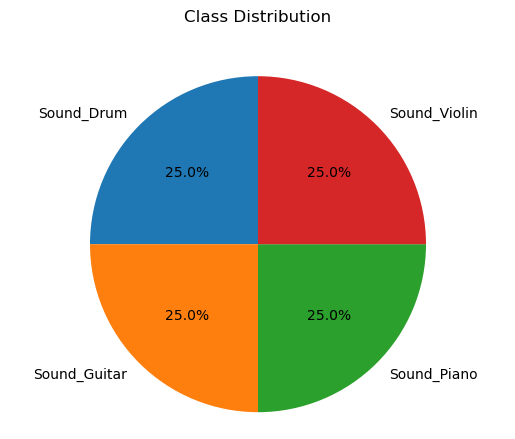

In [41]:
# Volume of each labels

fig, ax = plt.subplots()
ax.set_title('Class Distribution', y=1.08)
ax.pie(class_dist, labels=class_dist.index, autopct='%1.1f%%',
       shadow=False, startangle=90)
ax.axis('equal')
plt.show()
df.reset_index(inplace=True)

# Feature Extraction


In [78]:
# mfcc Extractor

def Feature_extractor(file):
    
    audio,sample_rate=librosa.load(file_name,res_type='kaiser_fast')
    mfccs_features=librosa.feature.mfcc(y=audio,sr=sample_rate,n_mfcc=40)
    mfccs_scaled_features =np.mean(mfccs_features.T,axis=0)
    return mfccs_scaled_features

In [79]:
extracted_features=[]

for index_num,row in tqdm(df.iterrows()):
    file_name = os.path.join(os.path.abspath("D:\\Train_submission"),str(row["FileName"]))
    final_class_label=row["Class"]
    data=Feature_extractor(file_name)
    extracted_features.append([data,final_class_label])

2629it [52:09,  1.19s/it] 


In [80]:
extracted_features_df=pd.DataFrame(extracted_features,columns=['features','class'])
extracted_features_df.head(20)

,features,class
0,"[-388.4289, 205.19734, 7.8636117, 39.286667, 1...",Sound_Guitar
1,"[-359.54538, 171.62688, 10.192534, 37.61143, 1...",Sound_Guitar
2,"[-347.31915, 178.11375, 2.161173, 38.960228, 1...",Sound_Guitar
3,"[-389.92075, 177.8204, 10.302906, 42.16702, 14...",Sound_Guitar
4,"[-372.23615, 161.71027, 10.579021, 45.089127, ...",Sound_Guitar
5,"[-391.01813, 173.12811, 18.012999, 37.28042, 1...",Sound_Guitar
6,"[-386.7482, 162.40793, 15.373853, 42.025448, 2...",Sound_Guitar
7,"[-408.49643, 160.14922, 20.34738, 41.80766, 18...",Sound_Guitar
8,"[-398.09885, 147.52005, 24.257866, 43.7894, 3....",Sound_Guitar
9,"[-411.7316, 151.5299, 22.383932, 37.782017, 2....",Sound_Guitar


In [83]:
# from sklearn.preprocessing import LabelEncoder
X=np.array(extracted_features_df['features'].tolist())
y=np.array(extracted_features_df["class"].tolist())

In [84]:
X.shape

(2629, 40)

In [85]:
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
LE=LabelEncoder()
y=to_categorical(LE.fit_transform(y))

In [86]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [87]:
print("Shape Of X_train:",X_train.shape)
print("Shape Of X_test:",X_test.shape)
print("Shape Of y_train:",y_train.shape)
print("Shape Of y_test:",y_test.shape)


Shape Of X_train: (2103, 40)
Shape Of X_test: (526, 40)
Shape Of y_train: (2103, 4)
Shape Of y_test: (526, 4)


In [88]:
# Setting labels
num_labels=y.shape[1]

# Model 

In [89]:
# Creating Our Model

model=Sequential()
model.add(Dense(100,input_shape=(40,)))
model.add(Activation('relu'))
model.add(Dropout(0.3))

model.add(Dense(200))
model.add(Activation('relu'))
model.add(Dropout(0.3))

model.add(Dense(200))
model.add(Activation('relu'))
model.add(Dropout(0.3))

model.add(Dense(100))
model.add(Activation('relu'))
model.add(Dropout(0.3))

model.add(Dense(num_labels))
model.add(Activation('softmax'))

In [90]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 100)               4100      
                                                                 
 activation (Activation)     (None, 100)               0         
                                                                 
 dropout (Dropout)           (None, 100)               0         
                                                                 
 dense_1 (Dense)             (None, 200)               20200     
                                                                 
 activation_1 (Activation)   (None, 200)               0         
                                                                 
 dropout_1 (Dropout)         (None, 200)               0         
                                                                 
 dense_2 (Dense)             (None, 200)               4

In [91]:
model.compile(loss='categorical_crossentropy',metrics=['accuracy'],optimizer='adam')

In [92]:
from tensorflow.keras.callbacks import ModelCheckpoint
# tf.keras.callbacks.ModelCheckpoint
from datetime import datetime

num_epochs=100
num_batch_size=32

checkpointer=ModelCheckpoint(filepath='saved_models/audio_classification.hdf5',verbose=1,save_best_only=True)
start=datetime.now()
history = model.fit(X_train,y_train,batch_size=num_batch_size,epochs=num_epochs,validation_data=(X_test,y_test),callbacks=checkpointer)

duration=datetime.now()-start
print("Training Completed in time: ",duration)

Epoch 1/100
64/66 [============================>.] - ETA: 0s - loss: 11.6844 - accuracy: 0.3267
Epoch 1: val_loss improved from inf to 1.20064, saving model to saved_models\audio_classification.hdf5
66/66 [==============================] - 11s 73ms/step - loss: 11.5071 - accuracy: 0.3281 - val_loss: 1.2006 - val_accuracy: 0.4240
Epoch 2/100
64/66 [============================>.] - ETA: 0s - loss: 2.9852 - accuracy: 0.3672
Epoch 2: val_loss improved from 1.20064 to 1.10418, saving model to saved_models\audio_classification.hdf5
66/66 [==============================] - 4s 57ms/step - loss: 2.9554 - accuracy: 0.3695 - val_loss: 1.1042 - val_accuracy: 0.4658
Epoch 3/100
65/66 [============================>.] - ETA: 0s - loss: 1.7663 - accuracy: 0.3966
Epoch 3: val_loss improved from 1.10418 to 1.08202, saving model to saved_models\audio_classification.hdf5
66/66 [==============================] - 2s 27ms/step - loss: 1.7599 - accuracy: 0.3975 - val_loss: 1.0820 - val_accuracy: 0.4144
Epoch

In [93]:
def plot_accuracy_loss(history):
    """
        Plot the accuracy and the loss during the training of the nn.
    """
    fig = plt.figure(figsize=(10,5))

    # Plot accuracy
    plt.subplot(221)
    plt.plot(history.history['accuracy'],'bo--', label = "accuracy")
    plt.plot(history.history['val_accuracy'], 'ro--', label = "val_accuracy")
    plt.title("train_accuracy vs val_accuracy")
    plt.ylabel("accuracy")
    plt.xlabel("epochs")
    plt.legend()

    # Plot loss function
    plt.subplot(222)
    plt.plot(history.history['loss'],'bo--', label = "loss")
    plt.plot(history.history['val_loss'], 'ro--', label = "val_loss")
    plt.title("train_loss vs val_loss")
    plt.ylabel("loss")
    plt.xlabel("epochs")

    plt.legend()
    plt.show()

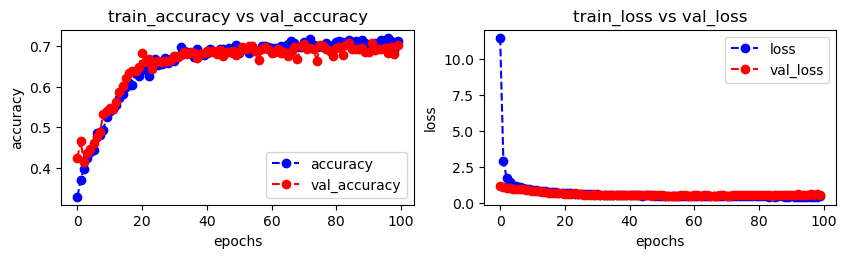

In [94]:
plot_accuracy_loss(history)

In [95]:

test_accuracy=model.evaluate(X_test,y_test,verbose=0)
print(test_accuracy[1])

0.7034220695495605


# Model testing 

In [96]:
# Testing an audio from test set

filename="D:\\Test_submission\\100bpm-808-like-drum-loop-74838.wav"
audio,sample_rate=librosa.load(filename,res_type='kaiser_fast')
mfccs_features=librosa.feature.mfcc(y=audio,sr=sample_rate,n_mfcc=40)
mfccs_scaled_features =np.mean(mfccs_features.T,axis=0)

print(mfccs_scaled_features)
mfccs_scaled_features=mfccs_scaled_features.reshape(1,-1)
print(mfccs_scaled_features)

predicted_label = np.argmax(model.predict(mfccs_scaled_features), axis=-1)
print(predicted_label)

prediction_class=LE.inverse_transform(predicted_label)
prediction_class

[-3.3858163e+02  2.0297174e+01  5.0213844e+01  5.1167347e+01
  2.4498297e+01  4.0453873e+01  1.1998336e+01  3.3762383e+01
  4.8888798e+00  2.5641972e+01  3.8860629e+00  1.8067570e+01
  2.5281525e+00  1.2451185e+01  3.5036521e+00  6.6308737e+00
  1.1089653e+00  5.7378211e+00 -2.1595893e+00  2.5276017e+00
 -2.0786428e+00  1.3901325e+00 -1.9444586e+00  1.9157994e+00
 -3.1415453e+00  4.8591413e+00 -3.5100169e+00  3.4173412e+00
 -1.4468851e+00  2.6175323e+00 -1.6390622e+00  4.2029622e-01
 -5.4378796e-01 -2.6113157e+00  8.4191829e-01 -2.1385620e+00
 -2.4945428e+00 -7.3274052e-01 -3.8853433e+00 -1.6577494e-01]
[[-3.3858163e+02  2.0297174e+01  5.0213844e+01  5.1167347e+01
   2.4498297e+01  4.0453873e+01  1.1998336e+01  3.3762383e+01
   4.8888798e+00  2.5641972e+01  3.8860629e+00  1.8067570e+01
   2.5281525e+00  1.2451185e+01  3.5036521e+00  6.6308737e+00
   1.1089653e+00  5.7378211e+00 -2.1595893e+00  2.5276017e+00
  -2.0786428e+00  1.3901325e+00 -1.9444586e+00  1.9157994e+00
  -3.1415453e+00 

array(['Sound_Drum'], dtype='<U12')

In [97]:
# Let's play that sound

import IPython.display as ipd 
ipd.Audio(filename)

In [102]:
filename2="D:\\Test_submission\\guitar-soundtrack-55233.wav"
audio,sample_rate=librosa.load(filename,res_type='kaiser_fast')
mfccs_features=librosa.feature.mfcc(y=audio,sr=sample_rate,n_mfcc=40)
mfccs_scaled_features =np.mean(mfccs_features.T,axis=0)

print(mfccs_scaled_features)
mfccs_scaled_features=mfccs_scaled_features.reshape(1,-1)
print(mfccs_scaled_features)

predicted_label = np.argmax(model.predict(mfccs_scaled_features), axis=-1)
print(predicted_label)

prediction_class=LE.inverse_transform(predicted_label)
prediction_class

[-3.7863126e+02  1.4193080e+02  1.4013284e+01  2.4378414e+01
  2.5987400e+01  8.7782269e+00 -5.5379381e+00 -9.7047949e+00
 -2.2391253e+01 -2.2530527e+01 -2.1084122e+01 -7.6257124e+00
 -6.1072512e+00 -8.5627747e+00 -5.4861269e+00  9.0910518e-01
 -1.1200379e+01 -7.6873569e+00 -4.8945856e+00 -7.1424742e+00
 -7.7636371e+00 -4.1930103e+00 -5.9470830e+00 -4.4484715e+00
 -6.9868584e+00 -9.4836702e+00 -1.7851555e+00  2.1469198e-01
 -2.7066782e+00 -3.8414683e+00 -6.7736454e+00 -7.5045409e+00
 -1.3059130e+00  5.3286262e+00  3.3785179e+00 -1.6931735e+00
 -2.9100926e+00 -5.5173078e+00 -2.0392389e+00  1.1754884e+00]
[[-3.7863126e+02  1.4193080e+02  1.4013284e+01  2.4378414e+01
   2.5987400e+01  8.7782269e+00 -5.5379381e+00 -9.7047949e+00
  -2.2391253e+01 -2.2530527e+01 -2.1084122e+01 -7.6257124e+00
  -6.1072512e+00 -8.5627747e+00 -5.4861269e+00  9.0910518e-01
  -1.1200379e+01 -7.6873569e+00 -4.8945856e+00 -7.1424742e+00
  -7.7636371e+00 -4.1930103e+00 -5.9470830e+00 -4.4484715e+00
  -6.9868584e+00 

array(['Sound_Guitar'], dtype='<U12')

In [101]:
ipd.Audio(filename2)